EDA Understand Negative Sentiment Per Entity 
==============

In [44]:
import pandas as pd
from collections import Counter

from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_extraction.text import CountVectorizer

from scipy.stats import pearsonr

import seaborn as sns
from nltk import ngrams

import matplotlib.pyplot as plt

from wordcloud import WordCloud, STOPWORDS

# Load Previously Processed Data 

In [45]:
processed_df = pd.read_csv('~/sentiment_analysis/archive/twitter_training_preprocessed.csv') 

# Understand The Dataset

In [46]:
processed_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70958 entries, 0 to 70957
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              70958 non-null  int64 
 1   entity          70958 non-null  object
 2   label           70958 non-null  object
 3   text            70958 non-null  object
 4   label_num       70958 non-null  int64 
 5   text_processed  69892 non-null  object
 6   combined        70958 non-null  object
dtypes: int64(2), object(5)
memory usage: 3.8+ MB


In [47]:
processed_df.describe()

,id,label_num
count,70958.000000,70958.000000
mean,6428.013402,1.620790
std,3738.757254,1.066408
min,1.000000,0.000000
25%,3192.250000,1.000000
50%,6418.000000,2.000000
75%,9590.000000,3.000000
max,13200.000000,3.000000


In [48]:
processed_df['entity'].value_counts()

entity
CallOfDuty                           2304
Verizon                              2301
MaddenNFL                            2294
NBA2K                                2290
TomClancysRainbowSix                 2287
Facebook                             2280
Microsoft                            2278
TomClancysGhostRecon                 2263
WorldOfCraft                         2248
johnson&johnson                      2247
ApexLegends                          2246
Battlefield                          2236
CallOfDutyBlackopsColdWar            2233
LeagueOfLegends                      2228
FIFA                                 2224
Dota2                                2218
Amazon                               2213
Overwatch                            2208
Hearthstone                          2201
GrandTheftAuto(GTA)                  2201
HomeDepot                            2199
Borderlands                          2192
Google                               2188
PlayStation5(PS5)          

# Data Clearning

## Drop Null Values

In [49]:
null_rows = processed_df[processed_df.isnull().any(axis=1)]
print(null_rows)

         id       entity       label                 text  label_num  \
11     2402  Borderlands    Positive                  was          3   
50     2409  Borderlands     Neutral                  all          2   
183    2432  Borderlands    Positive                  why          3   
193    2434  Borderlands    Negative                    I          1   
374    2465  Borderlands  Irrelevant                   is          0   
...     ...          ...         ...                  ...        ...   
70800  9173       Nvidia     Neutral      What's next now          2   
70810  9175       Nvidia     Neutral  And What's next for          2   
70811  9175       Nvidia     Neutral     What's next here          2   
70875  9186       Nvidia    Positive                 from          3   
70898  9190       Nvidia    Positive                 were          3   

      text_processed      combined  
11               NaN  Borderlands   
50               NaN  Borderlands   
183              NaN  Bo

In [50]:
null_rows['entity'].value_counts()

entity
Overwatch                            54
PlayerUnknownsBattlegrounds(PUBG)    53
TomClancysRainbowSix                 46
LeagueOfLegends                      46
ApexLegends                          45
NBA2K                                44
Borderlands                          43
Hearthstone                          43
RedDeadRedemption(RDR)               42
CS-GO                                41
WorldOfCraft                         38
Google                               37
Facebook                             36
Verizon                              32
TomClancysGhostRecon                 32
CallOfDuty                           32
HomeDepot                            30
Nvidia                               30
Fortnite                             30
CallOfDutyBlackopsColdWar            30
GrandTheftAuto(GTA)                  29
FIFA                                 29
Battlefield                          26
MaddenNFL                            26
Dota2                            

In [51]:
null_rows['label'].value_counts()

label
Positive      333
Negative      294
Neutral       278
Irrelevant    161
Name: count, dtype: int64

In [52]:
df = processed_df.dropna()

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 69892 entries, 0 to 70957
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              69892 non-null  int64 
 1   entity          69892 non-null  object
 2   label           69892 non-null  object
 3   text            69892 non-null  object
 4   label_num       69892 non-null  int64 
 5   text_processed  69892 non-null  object
 6   combined        69892 non-null  object
dtypes: int64(2), object(5)
memory usage: 4.3+ MB


## Drop Duplicate Tweets

In [77]:
df.head(10)

,id,entity,label,text,label_num,text_processed,combined
0,2401,Borderlands,Positive,im getting on borderlands and i will murder yo...,3,"m get borderland murder ,","Borderlands m get borderland murder ,"
1,2401,Borderlands,Positive,I am coming to the borders and I will kill you...,3,"come border kill ,","Borderlands come border kill ,"
2,2401,Borderlands,Positive,im getting on borderlands and i will kill you ...,3,"m get borderland kill ,","Borderlands m get borderland kill ,"
3,2401,Borderlands,Positive,im coming on borderlands and i will murder you...,3,"m come borderland murder ,","Borderlands m come borderland murder ,"
4,2401,Borderlands,Positive,im getting on borderlands 2 and i will murder ...,3,"m get borderland 2 murder ,","Borderlands m get borderland 2 murder ,"
5,2401,Borderlands,Positive,im getting into borderlands and i can murder y...,3,"m get borderland murder ,","Borderlands m get borderland murder ,"
6,2402,Borderlands,Positive,So I spent a few hours making something for fu...,3,spend hour make fun . . . know HUGE @borderlan...,Borderlands spend hour make fun . . . know HUG...
7,2402,Borderlands,Positive,So I spent a couple of hours doing something f...,3,spend couple hour fun ... know huge @ Borderla...,Borderlands spend couple hour fun ... know hug...
8,2402,Borderlands,Positive,So I spent a few hours doing something for fun...,3,spend hour fun ... know HUGE @ Borderlands fan...,Borderlands spend hour fun ... know HUGE @ Bor...
9,2402,Borderlands,Positive,So I spent a few hours making something for fu...,3,spend hour make fun . . . know HUGE RhandlerR ...,Borderlands spend hour make fun . . . know HUG...


In [69]:
df['id'].nunique()

12270

In [70]:
freq_counts = df['id'].value_counts()

In [75]:
duplicate_counts = freq_counts.value_counts()

In [76]:
duplicate_counts

count
6    9567
5    1570
4     877
3     117
2      76
1      63
Name: count, dtype: int64

In [78]:
df.drop_duplicates(subset='id', keep='first', inplace=True)

/var/folders/nc/9k0fsfgj0rxg80v72klxf3900000gn/T/ipykernel_15411/2287135690.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(subset='id', keep='first', inplace=True)


In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12270 entries, 0 to 70952
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              12270 non-null  int64 
 1   entity          12270 non-null  object
 2   label           12270 non-null  object
 3   text            12270 non-null  object
 4   label_num       12270 non-null  int64 
 5   text_processed  12270 non-null  object
 6   combined        12270 non-null  object
dtypes: int64(2), object(5)
memory usage: 766.9+ KB


In [80]:
df['entity'].value_counts()

entity
Dota2                                394
LeagueOfLegends                      394
WorldOfCraft                         393
Verizon                              393
Facebook                             393
MaddenNFL                            393
CallOfDuty                           393
CallOfDutyBlackopsColdWar            391
NBA2K                                391
ApexLegends                          390
TomClancysRainbowSix                 390
johnson&johnson                      388
Microsoft                            388
FIFA                                 385
Overwatch                            385
TomClancysGhostRecon                 384
Battlefield                          382
GrandTheftAuto(GTA)                  382
PlayStation5(PS5)                    382
HomeDepot                            381
Borderlands                          381
CS-GO                                380
Hearthstone                          379
Google                               377
Nvidia   

In [81]:
duplicates = df[df.duplicated(subset=['text'])]

In [82]:
duplicates['text'].value_counts()

Series([], Name: count, dtype: int64)

# Descriptive Statistics

In [86]:
df['id'].nunique()

12270

In [89]:
df['label'].value_counts()

label
Negative      3707
Positive      3436
Neutral       2994
Irrelevant    2133
Name: count, dtype: int64

In [90]:
df['entity'].value_counts()

entity
Dota2                                394
LeagueOfLegends                      394
WorldOfCraft                         393
Verizon                              393
Facebook                             393
MaddenNFL                            393
CallOfDuty                           393
CallOfDutyBlackopsColdWar            391
NBA2K                                391
ApexLegends                          390
TomClancysRainbowSix                 390
johnson&johnson                      388
Microsoft                            388
FIFA                                 385
Overwatch                            385
TomClancysGhostRecon                 384
Battlefield                          382
GrandTheftAuto(GTA)                  382
PlayStation5(PS5)                    382
HomeDepot                            381
Borderlands                          381
CS-GO                                380
Hearthstone                          379
Google                               377
Nvidia   

In [91]:
df['word_count'] = df['text'].str.split().str.len()

/var/folders/nc/9k0fsfgj0rxg80v72klxf3900000gn/T/ipykernel_15411/711995344.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['word_count'] = df['text'].str.split().str.len()


In [92]:
df['word_count'].value_counts()

word_count
12    545
6     479
7     471
11    469
8     462
     ... 
61      4
62      3
0       1
63      1
70      1
Name: count, Length: 65, dtype: int64

In [93]:
all_words = ' '.join(df['text']).split()
word_counts = pd.Series(all_words).value_counts()
print(word_counts)

.                             6962
the                           6146
to                            4674
and                           4023
I                             4013
                              ... 
smiley                           1
GPUs..                           1
Arriving                         1
pic.twitter.com/cbiyMbv4A8       1
partition                        1
Name: count, Length: 40366, dtype: int64


In [94]:
all_words = ' '.join(df['text_processed']).split()
word_counts = pd.Series(all_words).value_counts()
print(word_counts)

.                             16679
,                              4471
!                              4174
?                              1838
game                           1666
                              ...  
Varlope                           1
pic.twitter.com/VqL4QfUKVA        1
pic.twitter.com/rdwrVtSboV        1
Oculus                            1
ligiet                            1
Name: count, Length: 24330, dtype: int64


In [98]:
def generate_ngrams(text, n):
    words = text.split()  # Split the text into words
    return list(ngrams(words, n)) 

In [104]:
df['2grams'] = df['text_processed'].apply(lambda x: generate_ngrams(x, 2)) 

/var/folders/nc/9k0fsfgj0rxg80v72klxf3900000gn/T/ipykernel_15411/2380062329.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['2grams'] = df['text_processed'].apply(lambda x: generate_ngrams(x, 2))


In [105]:
all_ngrams = [ngram for ngram_list in df['2grams'] for ngram in ngram_list]
ngram_freq = Counter(all_ngrams)

print(ngram_freq.most_common(10)) 

[(('.', '.'), 3616), (('!', '!'), 1127), (('!', '.'), 702), (('..', '.'), 438), (('?', '?'), 403), (('&', 'Johnson'), 239), (('Johnson', '&'), 236), (('game', '.'), 231), (('Red', 'Dead'), 210), (('Dead', 'Redemption'), 203)]


In [106]:
df['3grams'] = df['text_processed'].apply(lambda x: generate_ngrams(x, 3))

/var/folders/nc/9k0fsfgj0rxg80v72klxf3900000gn/T/ipykernel_15411/214889189.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['3grams'] = df['text_processed'].apply(lambda x: generate_ngrams(x, 3))


In [107]:
all_ngrams = [ngram for ngram_list in df['3grams'] for ngram in ngram_list]
ngram_freq = Counter(all_ngrams)

print(ngram_freq.most_common(10)) 

[(('.', '.', '.'), 957), (('!', '!', '!'), 545), (('!', '.', '.'), 344), (('Johnson', '&', 'Johnson'), 236), (('?', '?', '?'), 209), (('Red', 'Dead', 'Redemption'), 202), (('Dead', 'Redemption', '2'), 145), (('!', '!', '.'), 132), (('Xbox', 'Series', 'X'), 88), (('?', '.', '.'), 86)]


# Data Visualization

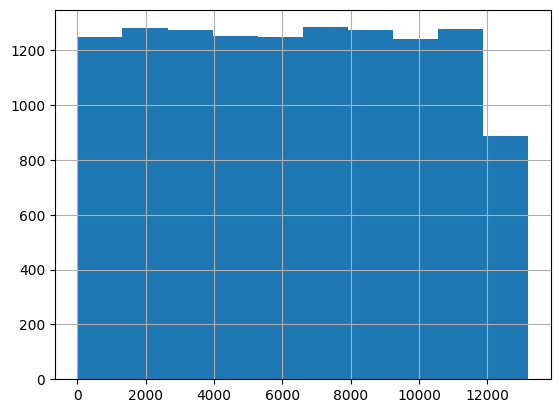

In [109]:
df['id'].hist()
plt.show()

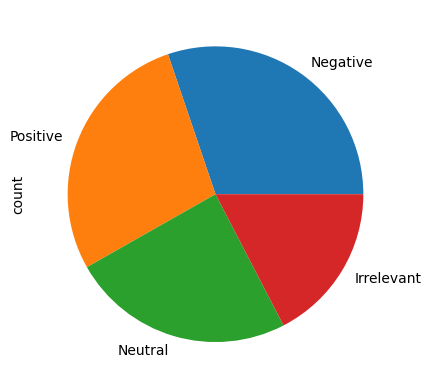

In [112]:
df['label'].value_counts().plot(kind='pie')
plt.show()

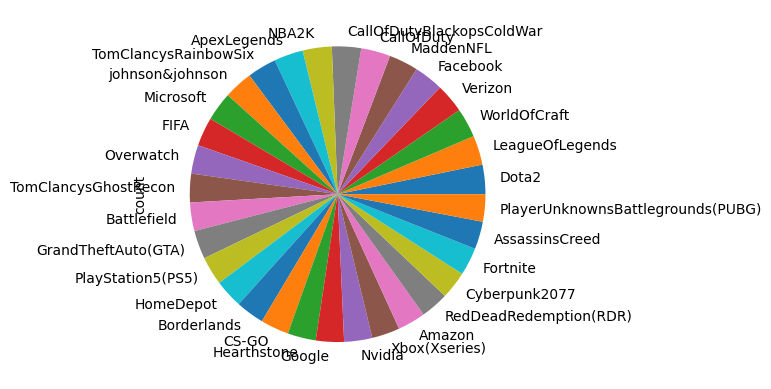

In [113]:
df['entity'].value_counts().plot(kind='pie')
plt.show()

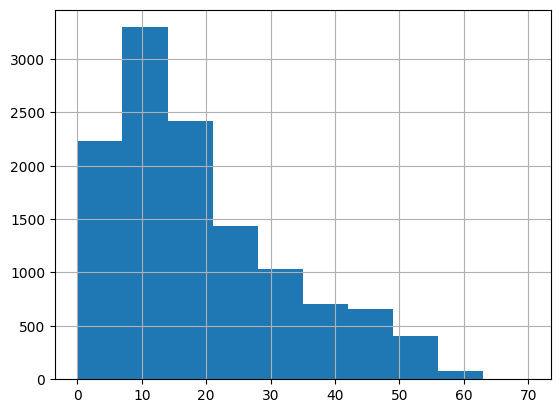

In [114]:
df['word_count'].hist()
plt.show()

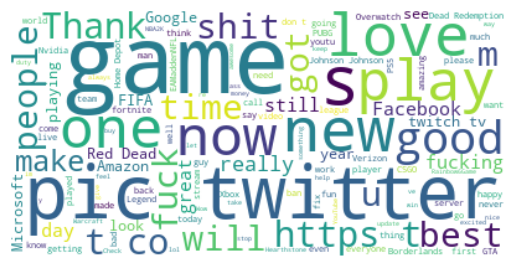

In [117]:
text = ' '.join(df['text'].astype(str).tolist())
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

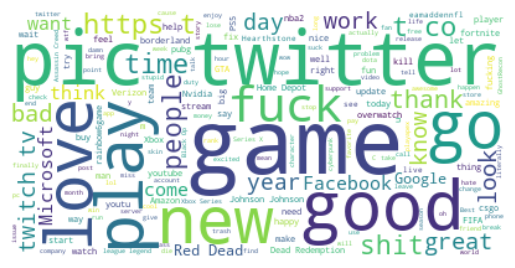

In [119]:
text = ' '.join(df['text_processed'].astype(str).tolist())
stopwords = set(STOPWORDS)
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(text)

# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

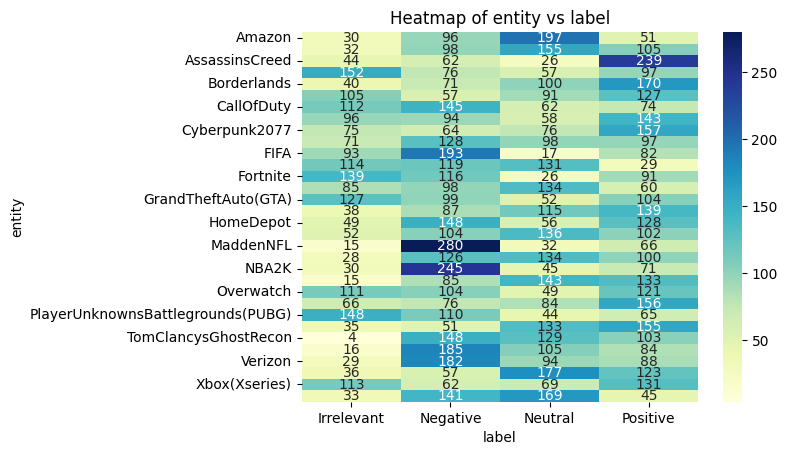

In [126]:
cross_tab = pd.crosstab(df['entity'], df['label'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='YlGnBu')
plt.title('Heatmap of entity vs label')
plt.xlabel('label')
plt.ylabel('entity')
plt.show()

# Multi-variance Analysis Between Entity, Label, and Word


## Data Preprocessing 

### Filter Out Irrelevant Data 

In [127]:
df = df[processed_df['label'] != 'Irrelevant']

/var/folders/nc/9k0fsfgj0rxg80v72klxf3900000gn/T/ipykernel_15411/2197543741.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[processed_df['label'] != 'Irrelevant']


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10137 entries, 0 to 70952
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   id              10137 non-null  int64 
 1   entity          10137 non-null  object
 2   label           10137 non-null  object
 3   text            10137 non-null  object
 4   label_num       10137 non-null  int64 
 5   text_processed  10137 non-null  object
 6   combined        10137 non-null  object
 7   word_count      10137 non-null  int64 
 8   ngrams          10137 non-null  object
 9   2grams          10137 non-null  object
 10  3grams          10137 non-null  object
dtypes: int64(3), object(8)
memory usage: 950.3+ KB


### Apply Ordinal Encoding To Label 

In [129]:
encoder = OrdinalEncoder(categories=[['Negative', 'Neutral', 'Positive']])
df['encoded_label'] = encoder.fit_transform(df[['label']]) 

### Group by entity 

In [162]:
grouped_df = df.groupby('entity')

## Correlation Analysis

### Tokenization With Binary Presence

In [163]:
def to_words_df(entity, group, vectorizer): 
    word_matrix = vectorizer.fit_transform(group['text_processed']).toarray()
    words_df = pd.DataFrame(word_matrix, columns=vectorizer.get_feature_names_out())
    words_df['encoded_label'] = group['encoded_label'].values
    return words_df 

### Calculate Pearson Correlation Coefficient Between Each Word and Label

In [164]:
correlations_entities = {}
for entity, group in grouped_df: 
    vectorizer = CountVectorizer(binary=True)
    words_df = to_words_df(entity, group, vectorizer)
    correlations = {}
    for word in vectorizer.get_feature_names_out():
        corr, _ = pearsonr(words_df[word], words_df['encoded_label'])
        correlations[word] = corr
    correlations_entities[entity] = correlations

### Results Analysis

In [165]:
def findTopWordsInNegativeReview(correlations, n): 
    
    sorted_correlations = sorted(correlations.items(), key=lambda x: x[1], reverse=False)
    strs = []
    for word, corr in sorted_correlations[:n]:
        strs.append(f"{word}[{corr:.2f}]")
    print(''.join(strs))

In [166]:
for entity in correlations_entities: 
    print("Entity: ", entity)
    
    findTopWordsInNegativeReview(correlations_entities[entity], 10)

Entity:  Amazon
fuck[-0.23]say[-0.18]problem[-0.16]amazonhelp[-0.16]think[-0.15]refuse[-0.15]fucking[-0.15]evil[-0.15]delay[-0.13]hard[-0.13]
Entity:  ApexLegends
fix[-0.31]playapex[-0.26]server[-0.25]game[-0.18]account[-0.18]respawn[-0.18]suck[-0.16]issue[-0.15]ea[-0.15]know[-0.15]
Entity:  AssassinsCreed
bullshit[-0.19]ago[-0.19]try[-0.18]like[-0.18]throw[-0.15]alexios[-0.15]manage[-0.15]trash[-0.15]burn[-0.15]dialogue[-0.15]
Entity:  Battlefield
eahelp[-0.24]bad[-0.19]multiplayer[-0.19]not[-0.17]account[-0.17]xbox[-0.16]issue[-0.15]launch[-0.15]friend[-0.15]company[-0.15]
Entity:  Borderlands
fix[-0.27]crash[-0.19]gearboxofficial[-0.19]update[-0.18]console[-0.18]figure[-0.15]rate[-0.15]enemy[-0.15]ago[-0.15]shift[-0.15]
Entity:  CS-GO
csgo[-0.24]valvesoftware[-0.22]cheat[-0.18]fix[-0.18]issue[-0.17]cause[-0.17]loss[-0.17]valve[-0.17]hacker[-0.16]server[-0.15]
Entity:  CallOfDuty
update[-0.21]activision[-0.19]fix[-0.17]shit[-0.16]callofduty[-0.14]atviassist[-0.13]fuck[-0.12]ass[-0.12

In [167]:
import wordcloud
from matplotlib import pyplot as plt

def visualize_dict_wordcloud(dictionary):
    """Visualizes a dictionary using a word cloud based on values."""

    # Create a WordCloud object
    cloud = wordcloud.WordCloud(width=800, height=400, background_color="white")

    # Generate the word cloud using the dictionary
    reversed_dict = {k: -v for k, v in dictionary.items() if v < 0}
    cloud.generate_from_frequencies(reversed_dict)

    # Display the generated image
    plt.figure(figsize=(10, 8))
    plt.imshow(cloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Amazon


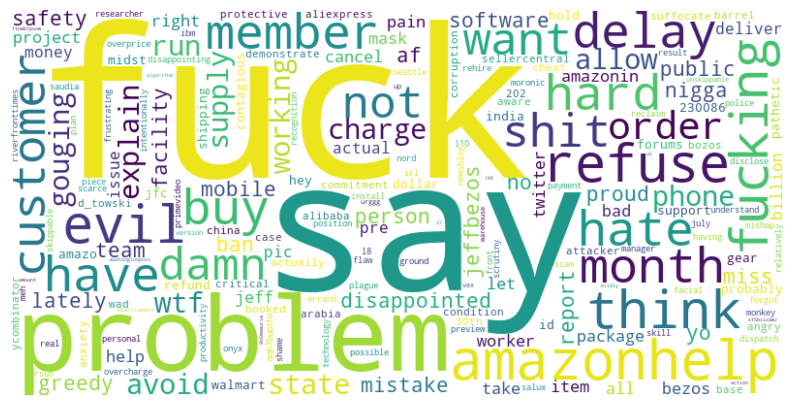

ApexLegends


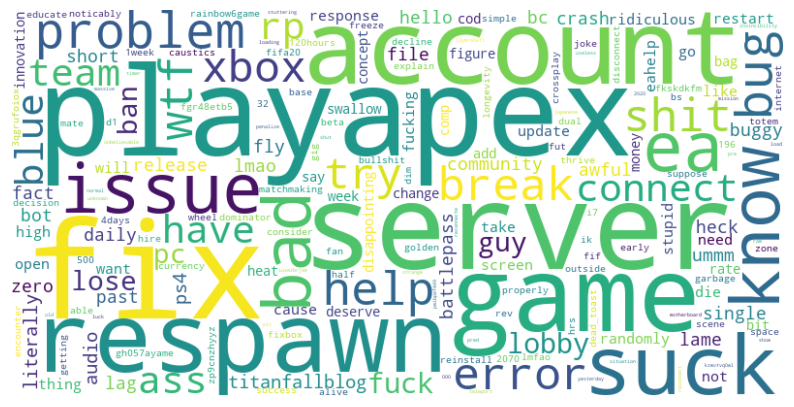

AssassinsCreed


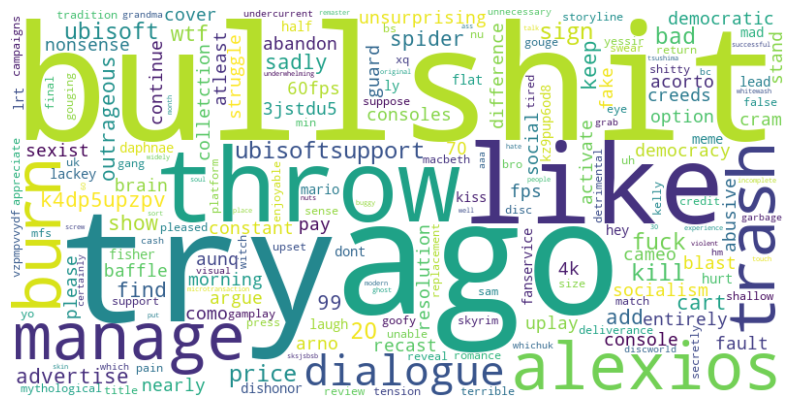

Battlefield


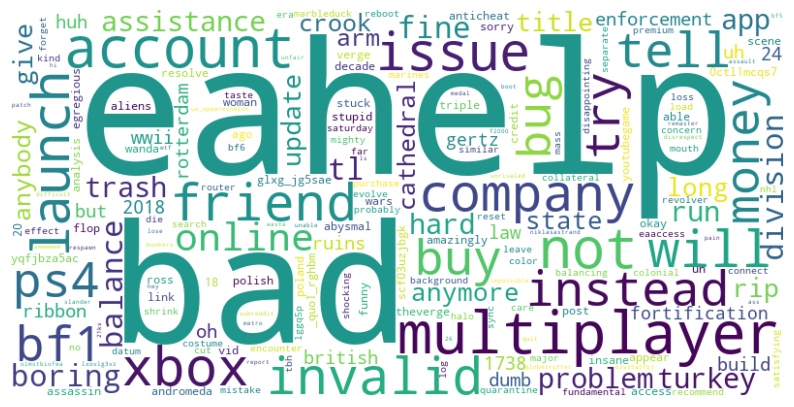

Borderlands


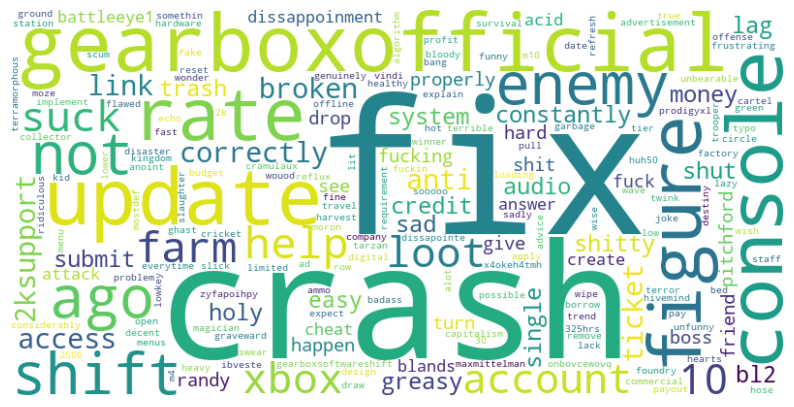

CS-GO


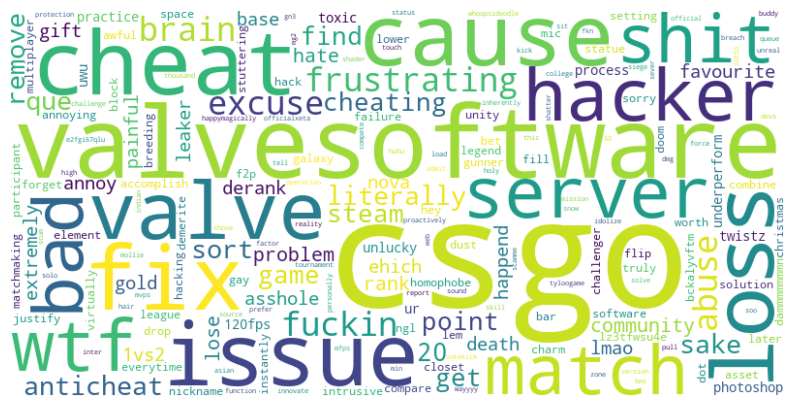

CallOfDuty


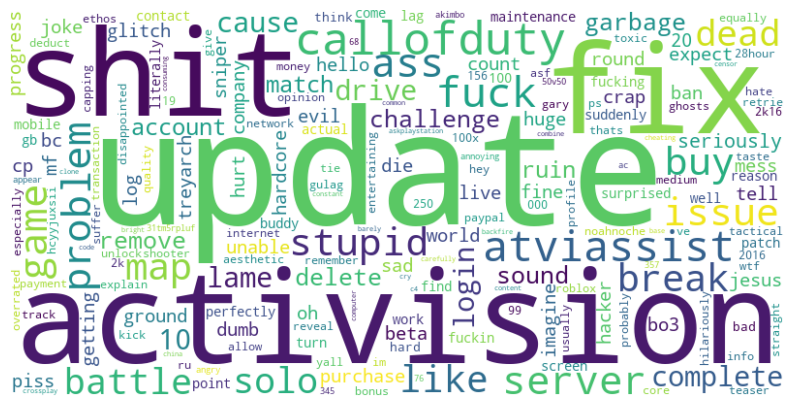

CallOfDutyBlackopsColdWar


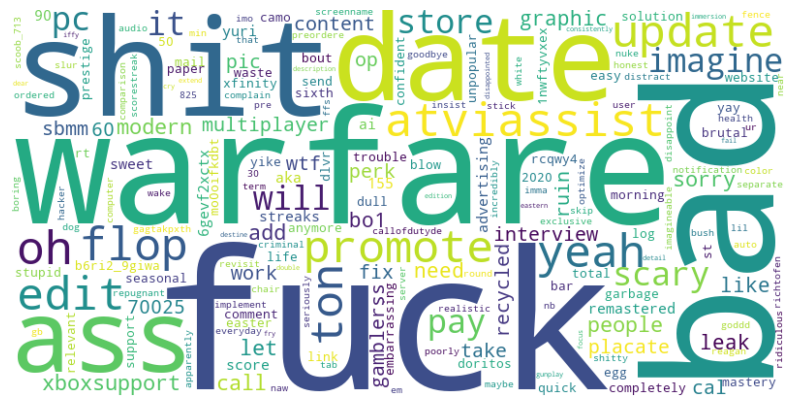

Cyberpunk2077


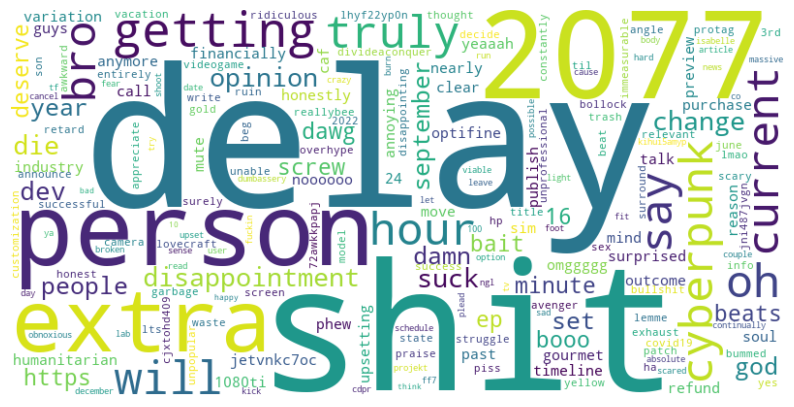

Dota2


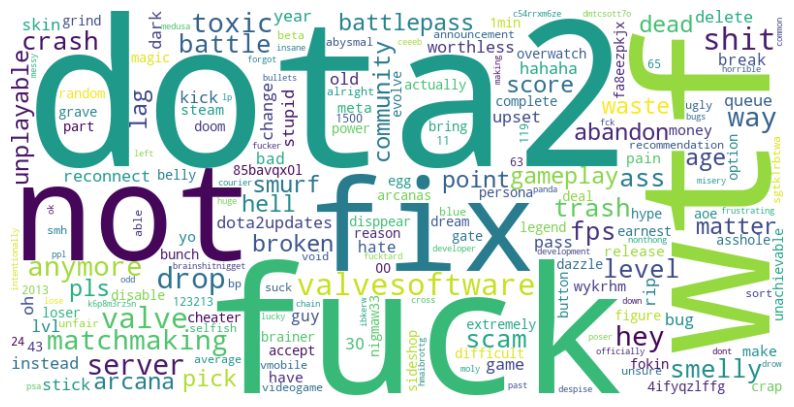

FIFA


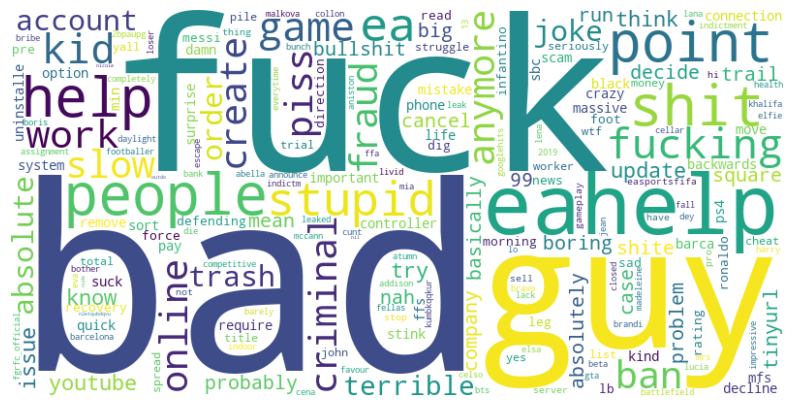

Facebook


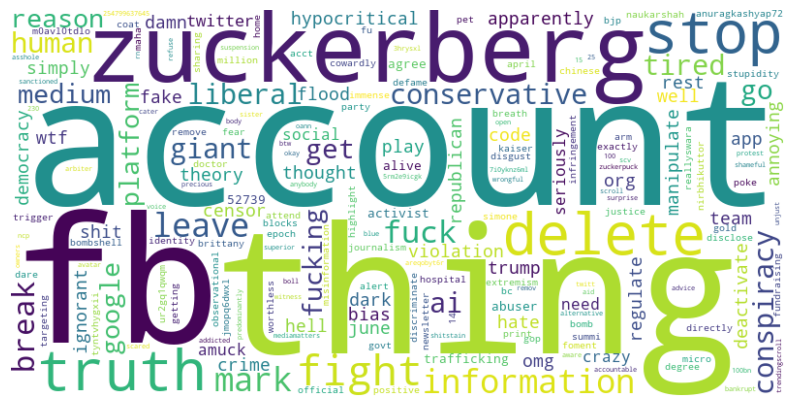

Fortnite


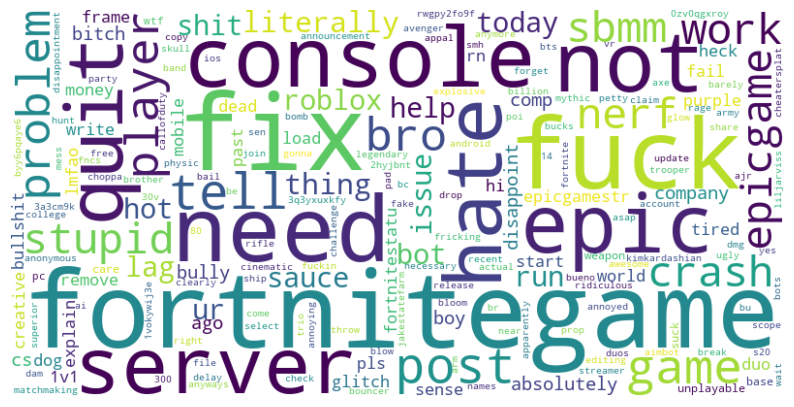

Google


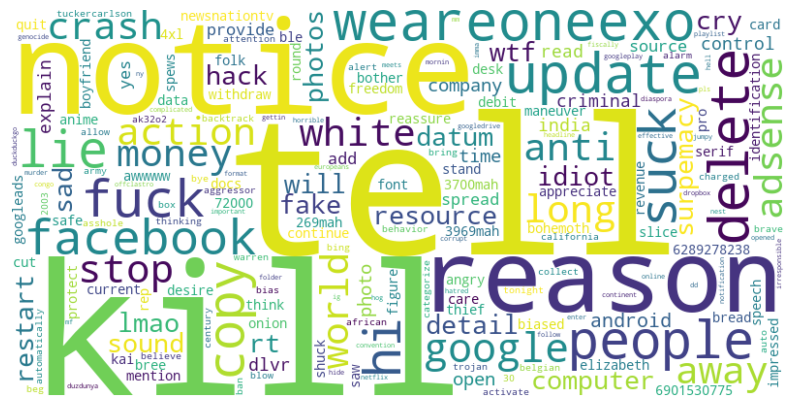

GrandTheftAuto(GTA)


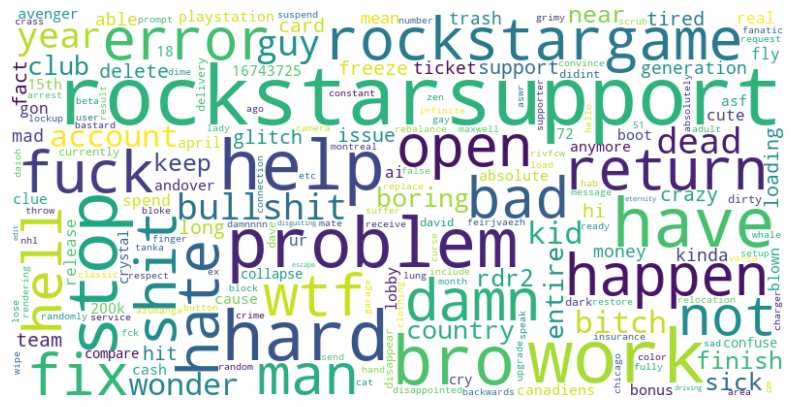

Hearthstone


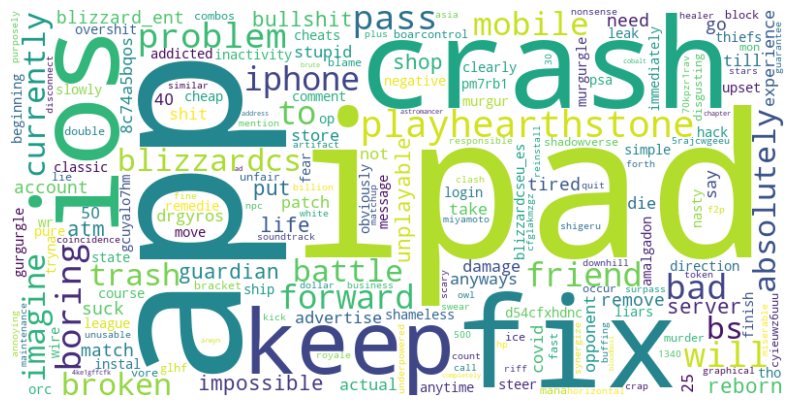

HomeDepot


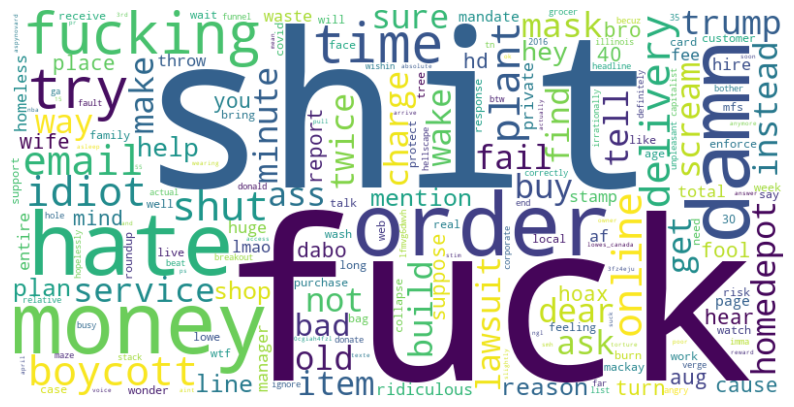

LeagueOfLegends


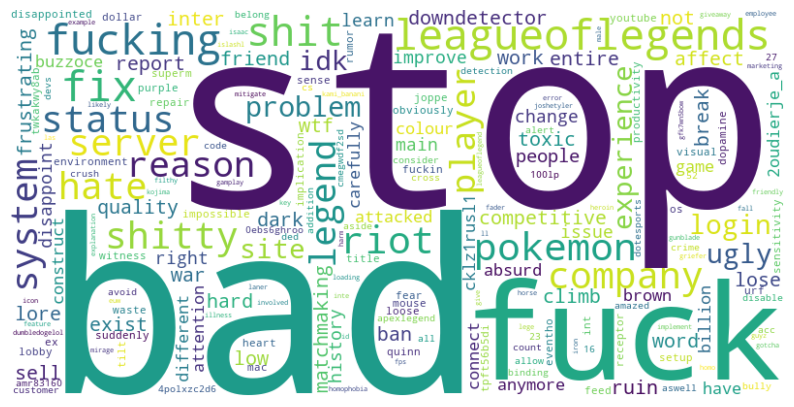

MaddenNFL


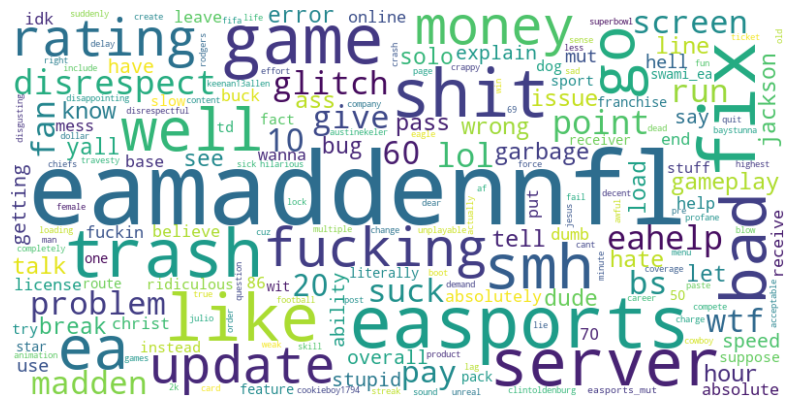

Microsoft


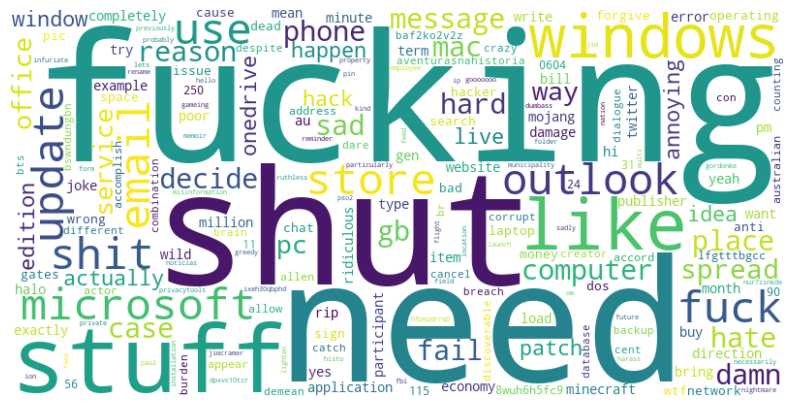

NBA2K


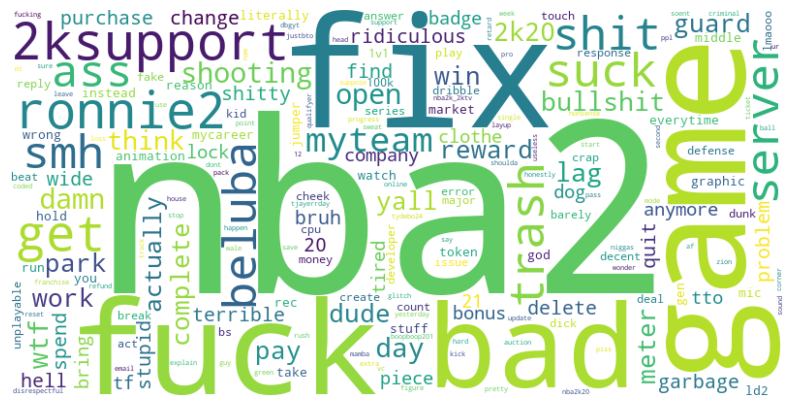

Nvidia


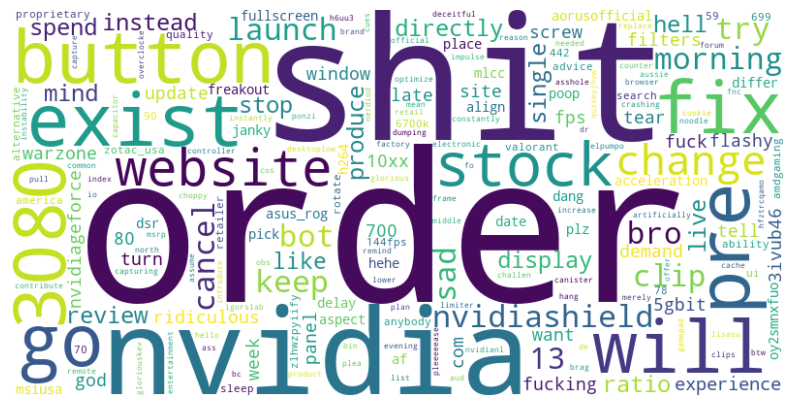

Overwatch


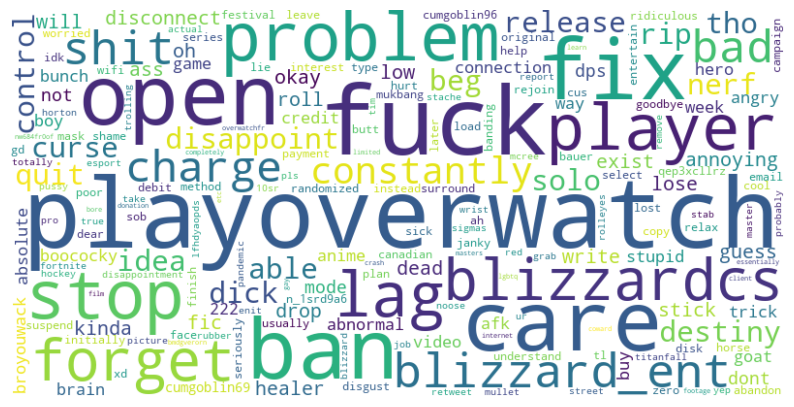

PlayStation5(PS5)


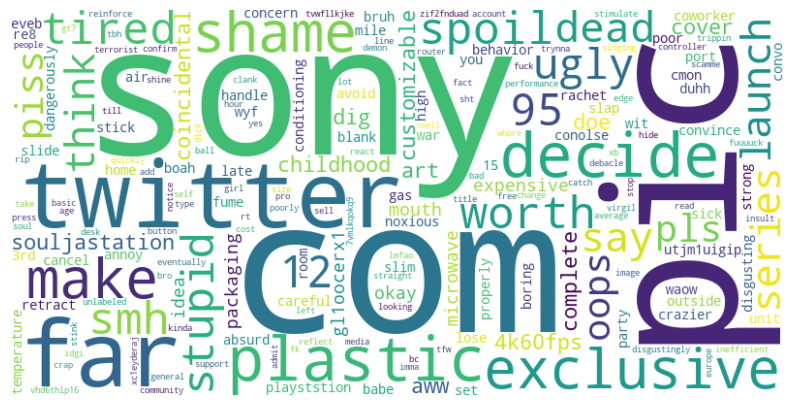

PlayerUnknownsBattlegrounds(PUBG)


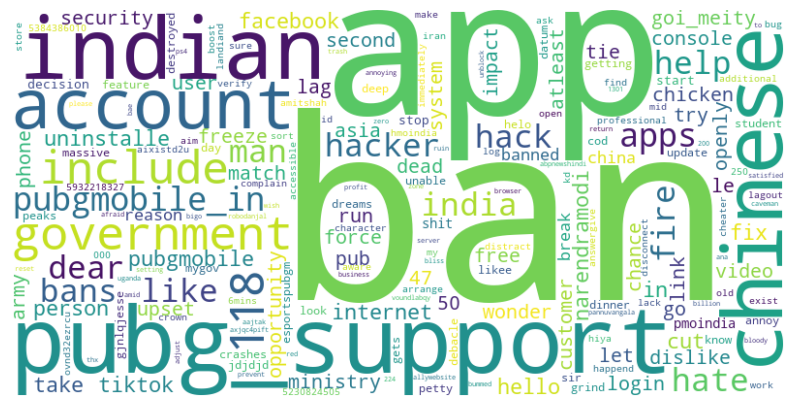

RedDeadRedemption(RDR)


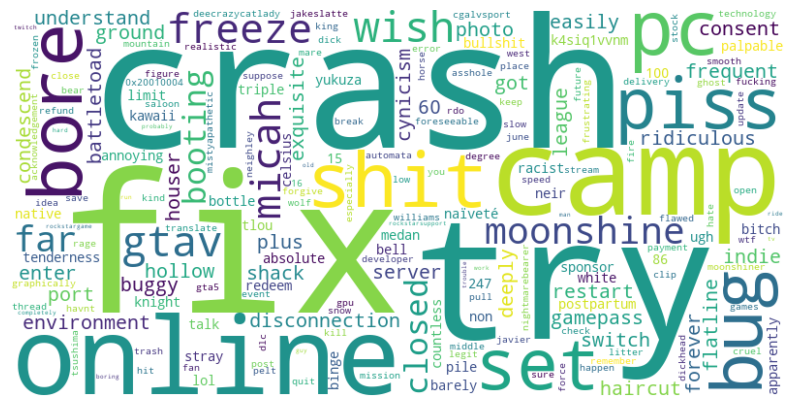

TomClancysGhostRecon


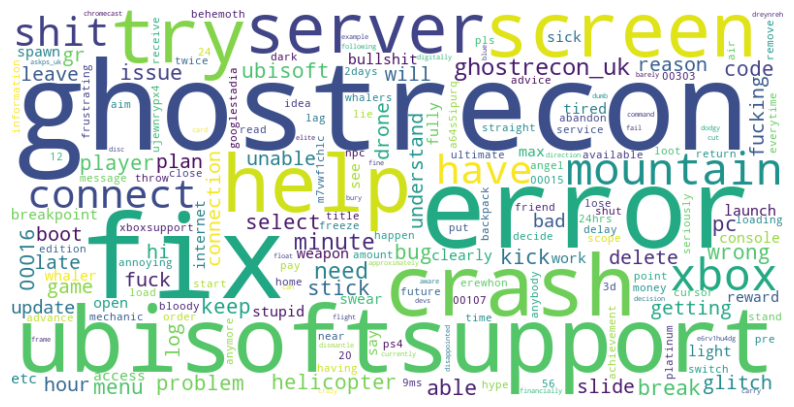

TomClancysRainbowSix


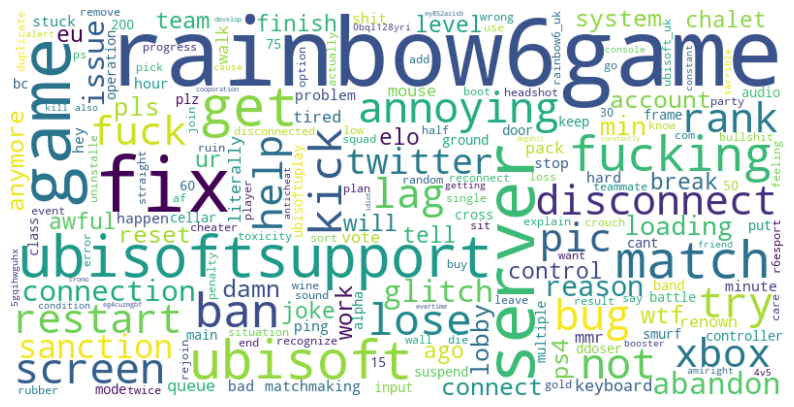

Verizon


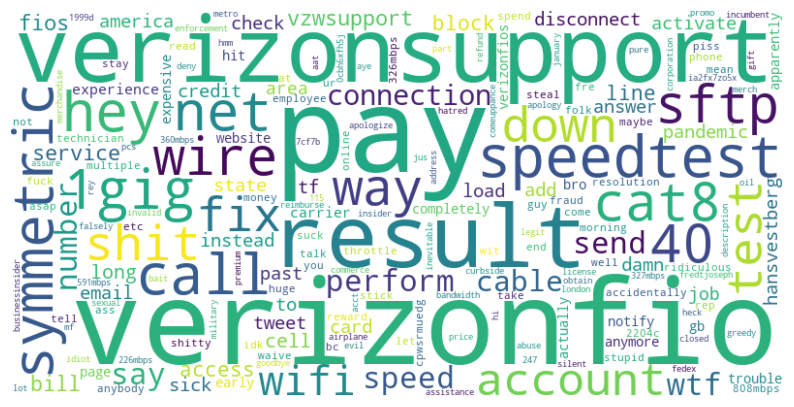

WorldOfCraft


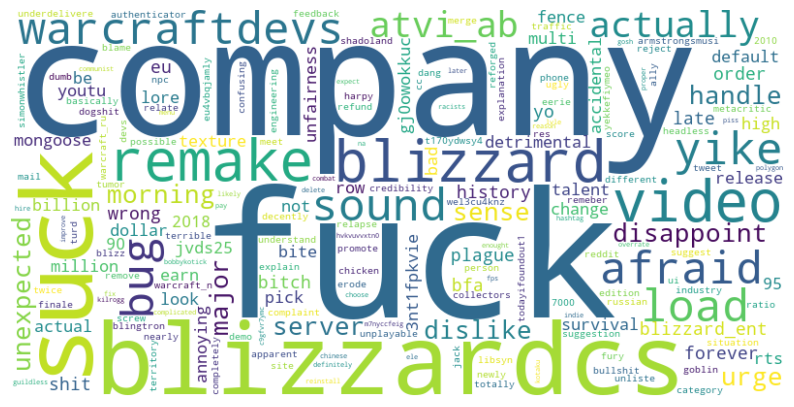

Xbox(Xseries)


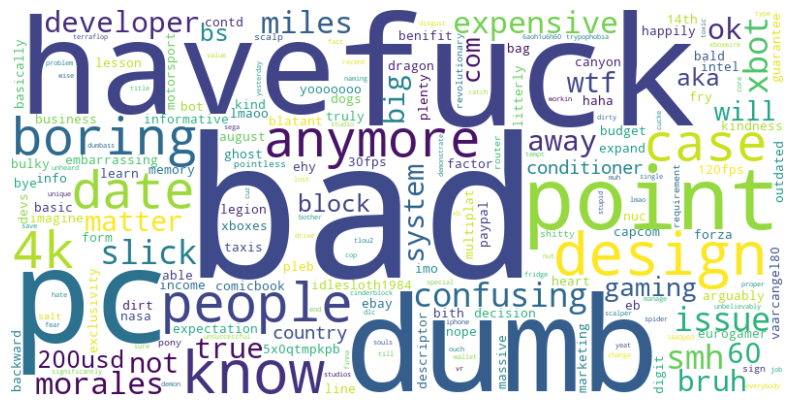

johnson&johnson


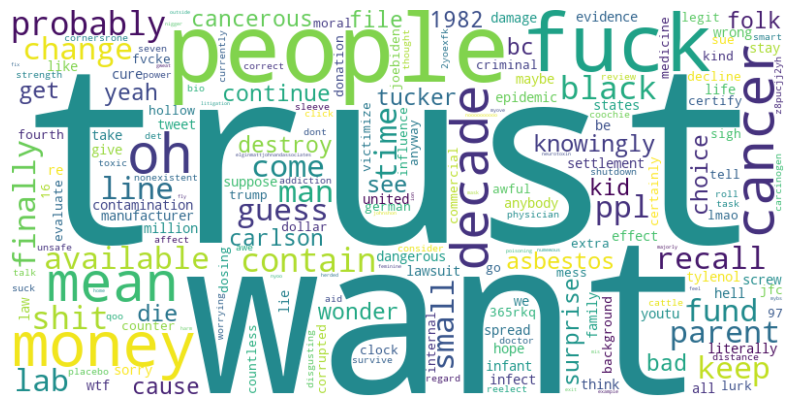

In [169]:
for entity in correlations_entities: 
    print(entity)
    visualize_dict_wordcloud(correlations_entities[entity])